# Example 1: Comparing sampling for the toy problem  

## Use r=-1 (mulit-modal model)

In [1]:
# To start this notebook with more than one thread run "export JULIA_NUM_THREADS=4" in the terminal 
# before starting the jupyter notebook

# Ensure that Julia was launched with an appropriate number of threads
println(Threads.nthreads())

6


In [2]:
# Import module. 
using Revise
using PriorNormalization

In [3]:
# Import packages 
using AdaptiveMCMC # for using adaptive MCMC sampling
using AdvancedMH # for using MH sampling 
using ApproxFun # for approximating gammainvccdf by a Chebychev interpolant to then use AD  
using CairoMakie # for plots
using Dates # to measure computational time 
using FlexiMaps # for log-range
using ForwardDiff # for AD
using KernelDensity # for estimating densities from samples 
using LinearAlgebra 
using QuadGK # for numerical integration 
using Random # for setting the random seed 
using StatsBase # for defining customized distributions 
using StatsFuns # for defining customized distributions 
using StatsPlots # for plotting 
using SpecialFunctions
using Turing # for setting up the model and sampling 
using Optim # for ML and MAP estimation 
using Plots: Plots, plot, plot!, scatter, scatter!, savefig, surface, surface!
using ProgressMeter # to show progress 

## Toy problem 

In [4]:
# Set the random seed
Random.seed!(1234)

# Parameter of of generalized gamma hyper-prior 
r_range = [ 1.0, .5, -.5, -1.0 ]; 
β_range = [ 1.501, 3.0918, 2.0165, 1.0017 ];
ϑ_range = [ 5*10^(-2), 5.9323*10^(-3), 1.2583*10^(-3), 1.2308*10^(-4) ];

# Fix model parameters.
y = .2 # observational data 
σ² = 10^(-2.8) # noise variance

0.001584893192461114

## Select the model: $r=-1$

In [5]:
# Select hyper-hyper-parameters 
i = 4 
r = r_range[i] # power parameter 
β = β_range[i] # shape parameter 
ϑ = ϑ_range[i] # scale parameter

0.00012308

In [6]:
interval = -5..5
# Create an array of functions
if r > 0 
    Γinvccdf_cheb = Fun(τ -> gammainvccdf(β, 1, 0.5*erfc(τ/sqrt(2)) ), interval)
else 
    Γinvccdf_cheb = Fun(τ -> gammainvccdf(β, 1, 0.5 + 0.5*erf(τ/sqrt(2)) ), interval)
end

# Calculate the value and derivative at the boundaries
Γinvccdf_val_left = Γinvccdf_cheb(interval.left)
Γinvccdf_val_right = Γinvccdf_cheb(interval.right)

Γinvccdf_deriv_left = ForwardDiff.derivative(Γinvccdf_cheb, interval.left)
Γinvccdf_deriv_right = ForwardDiff.derivative(Γinvccdf_cheb, interval.right)

# Define the extended function
function Γinvccdf_cheb_extd(τ)
    if τ < -5
        return Γinvccdf_val_left + Γinvccdf_deriv_left * (τ - interval.left)
    elseif τ > 10
        return abs(Γinvccdf_val_right + Γinvccdf_deriv_right * (τ - interval.right))
    else
        return Γinvccdf_cheb(τ)
    end
end

Γinvccdf_cheb_extd (generic function with 1 method)

## Models for the original and prior-normalized posterior

In [7]:
# Define the original log-posterior density 
function logpdf_original(θ, x; y, σ², r, β, ϑ)    
    if any(θ .<= 0) # any non-positive element? 
        logpdf = -Inf 
    else
        logpdf = -(0.5/σ²)*norm(x-y)^2 - 
            0.5*sum( x.^2 ./ θ ) - 
            sum( (θ/ϑ).^r ) + 
            (r*β-1.5)*sum( log.(θ) )
    end
    
    return logpdf
end

logpdf_original (generic function with 1 method)

In [8]:
# Define the prior-normalized log-posterior density 
function logpdf_priorNormalized(τ, u; y, σ², r, β, ϑ, Φ::Function) 
    # Get z-value by using transport map 
    #x = similar(u)
    x = 0.0
    x = priorNormalizing_KR_inv_tu_fast( u, τ; r, β, ϑ, Φ )
    
    # Get log-posterior 
    logpdf = -0.5*sum( u.^2 + τ.^2 ) - (0.5/σ²)*norm(x-y)^2
    
    return logpdf
end

logpdf_priorNormalized (generic function with 1 method)

In [9]:
# Define the transformed (following Calvetti & Somersalo) log-posterior density 
function logpdf_CalvettiSomersalo(ω, v; y, σ², r, β, ϑ) 
    # Recover x and θ from v and ω
    x, θ = transform_CalvettiSomersalo2024( v, ω; r, β, ϑ ) 
    
    # Formulate the log-posterior PDF 
    logpdf = -(.5/σ²)*(x-y)^2 + (2*β-1)*sum( log.( abs.(ω) ) ) - 0.5*( v^2 + ω^2 )
    
    return logpdf
end

logpdf_CalvettiSomersalo (generic function with 1 method)

In [10]:
# Condition the log-PDF functions on the given data and parameters
logpdf_original(z) = logpdf_original(
    z[1], z[2]; y, σ², r, β, ϑ
)

logpdf_priorNormalized(z) = logpdf_priorNormalized(
    z[1], z[2]; y, σ², r, β, ϑ, Φ=Γinvccdf_cheb_extd
)

logpdf_CalvettiSomersalo(z) = logpdf_CalvettiSomersalo(
    z[1], z[2]; y, σ², r, β, ϑ
)

logpdf_CalvettiSomersalo (generic function with 2 methods)

## MAP estimation

In [11]:
# Initial guess for the optimization (θ and z)
initial_guess = [1e-3; 0.0]

# Negative log-posterior 
neg_logpdf_original(z) = -logpdf_original(z)

# MAP estimation  
MAP_original = optimize(
    neg_logpdf_original, initial_guess, LBFGS(), 
    Optim.Options(iterations = 10_000, time_limit = 60.0)
)

 * Status: success (objective increased between iterations)

 * Candidate solution
    Final objective value:     -1.010919e+01

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.65e-13 ≰ 0.0e+00
    |x - x'|/|x'|          = 2.25e-11 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.83e-13 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.81e-14 ≰ 0.0e+00
    |g(x)|                 = 2.35e-09 ≤ 1.0e-08

 * Work counters
    Seconds run:   0  (vs limit 60)
    Iterations:    15
    f(x) calls:    67
    ∇f(x) calls:   67


In [12]:
# Extract the numerical values 
MAP_original_values = Optim.minimizer(MAP_original)
θ_MAP = MAP_original_values[1];
x_MAP = MAP_original_values[2]; 
θ_MAP, x_MAP

(6.0367154286361356e-5, 0.007338310244434342)

In [13]:
# Initial guess for the optimization (τ and u)
initial_guess = [0.0; 0.0]

# Negative log-posterior 
neg_logpdf_priorNormalized(z) = -logpdf_priorNormalized(z)

# MAP estimation  
MAP_priorNormalized = optimize(
    neg_logpdf_priorNormalized, initial_guess, LBFGS(), 
    Optim.Options(iterations = 10_000, time_limit = 60.0)
)

 * Status: success (objective increased between iterations)

 * Candidate solution
    Final objective value:     4.070127e+00

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 8.95e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 3.58e-10 ≰ 0.0e+00
    |f(x) - f(x')|         = 5.68e-14 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.40e-14 ≰ 0.0e+00
    |g(x)|                 = 3.14e-09 ≤ 1.0e-08

 * Work counters
    Seconds run:   0  (vs limit 60)
    Iterations:    11
    f(x) calls:    35
    ∇f(x) calls:   35


In [14]:
# Extract the numerical values 
MAP_priorNormalized_values = Optim.minimizer(MAP_priorNormalized)
τ_MAP = MAP_priorNormalized_values[1];
u_MAP = MAP_priorNormalized_values[2]; 
τ_MAP, u_MAP

(2.4954295243816786, 1.3296883789252394)

In [15]:
# Initial guess for the optimization (ω and v)
initial_guess = [0.01; 0.01]

# Negative log-posterior 
neg_logpdf_CalvettiSomersalo(z) = -logpdf_CalvettiSomersalo(z)

# MAP estimation  
MAP_CalvettiSomersalo = optimize(
    neg_logpdf_CalvettiSomersalo, initial_guess, LBFGS(), 
    Optim.Options(iterations = 10_000, time_limit = 60.0)
)

 * Status: success

 * Candidate solution
    Final objective value:     3.036529e+00

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.24e-07 ≰ 0.0e+00
    |x - x'|/|x'|          = 1.24e-07 ≰ 0.0e+00
    |f(x) - f(x')|         = 2.53e-13 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 8.32e-14 ≰ 0.0e+00
    |g(x)|                 = 4.77e-10 ≤ 1.0e-08

 * Work counters
    Seconds run:   0  (vs limit 60)
    Iterations:    13
    f(x) calls:    51
    ∇f(x) calls:   51


In [16]:
# Extract the numerical values 
MAP_CalvettiSomersalo_values = Optim.minimizer(MAP_CalvettiSomersalo)
ω_MAP = MAP_CalvettiSomersalo_values[1];
v_MAP = MAP_CalvettiSomersalo_values[2]; 
ω_MAP, v_MAP

(-0.0816834665199509, 0.9983626271141555)

# Sampling

In [17]:
# Prepare arguments.  
nr_chains = 4 # number of chains to sample 
nr_samples = 10^6 # number of samples 
burn_in = Int64(ceil(nr_samples/10)) # Burn-in length of 10%
nr_parameters = 2

2

## Sampling: ASM

We use an adaptive scaling Metropolis (ASM). 
See https://mvihola.github.io/docs/AdaptiveMCMC.jl/, https://github.com/mvihola/AdaptiveMCMC.jl, and https://mvihola.github.io/docs/AdaptiveMCMC.jl/adapt/#Adaptation-state for details. 

### The original posterior

In [18]:
# Produce samples. 
init_param = [θ_MAP, x_MAP]
chn_values = zeros(Float64, nr_samples+burn_in, nr_parameters, nr_chains)

# Start the wall clock timer
wall_start = now()

# Use multiple threads. 
@showprogress Threads.@threads for j in 1:nr_chains   
    # generate samples
    chn_values[:,:,j] = adaptive_rwm(
        init_param, 
        logpdf_original, 
        nr_samples+burn_in; # number of samples (add burn-in length) 
        algorithm=:asm, 
        b=1, # burn in length 
        progress=true # show progress meter
    ).X'
    
    # Clear memory after each chain
    GC.gc()
end

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_AM_original = Dates.value(wall_duration_ms) / 1000

# Define the parameter names (optional)
param_names = ["θ", "x"]

# Create the Chains object
chn_AM_original = Chains(chn_values, Symbol.(param_names))

# Throw away samples from the burn-in phase 
chn_AM_original = chn_AM_original[burn_in+1:end, :, :]

# Free the memory occupied by chn_values
chn_values = nothing
GC.gc()  # Optionally trigger garbage collection manually

Progress: 100%|█████████████████████████████████████████| Time: 0:00:044:17Progress:   0%|                                         |  ETA: 9 days, 16:24:43Progress:   0%|                                         |  ETA: 9 days, 16:24:17



Progress: 100%|█████████████████████████████████████████| Time: 0:00:05


In [19]:
# Determine the acceptence rates 
samples_x_original = (get(chn_AM_original, :x).x).data

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_x_original[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")

Chain 1 acceptance rate: 0.2341912341912342
Chain 2 acceptance rate: 0.23436323436323436
Chain 3 acceptance rate: 0.23417523417523417
Chain 4 acceptance rate: 0.23446123446123446
Average acceptance rate: 0.23429773429773432


### The prior-normalized posterior

In [20]:
# Produce samples. 
init_param = [τ_MAP, u_MAP]
chn_values = zeros(Float64, nr_samples+burn_in, nr_parameters, nr_chains)

# Start the wall clock timer
wall_start = now()

# Use multiple threads. 
@showprogress Threads.@threads for j in 1:nr_chains   
    # generate samples
    chn_values[:,:,j] = adaptive_rwm(
        init_param, 
        logpdf_priorNormalized, 
        nr_samples+burn_in; # number of samples (add burn-in length) 
        algorithm=:asm, 
        b=1, # burn in length 
        progress=true # show progress meter
    ).X'
    
    # Clear memory after each chain
    GC.gc()
end

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_AM_priorNormalized = Dates.value(wall_duration_ms) / 1000

# Define the parameter names (optional)
param_names = ["τ", "u"]

# Create the Chains object
chn_AM_priorNormalized = Chains(chn_values, Symbol.(param_names))

# Throw away samples from the burn-in phase 
chn_AM_priorNormalized = chn_AM_priorNormalized[burn_in+1:end, :, :]

# Free the memory occupied by chn_values
chn_values = nothing
GC.gc()  # Optionally trigger garbage collection manually

Progress:  38%|███████████████▍                         |  ETA: 0:00:04:26mProgress:  38%|███████████████▊                         |  ETA: 0:00:04 base64 binary data: oJWmJQEAAAAAgbMpAQAAAKCVpiUBAAAAoJWmJQEAAACwcqYlAQAAAKCVpiUBAAAAoJWmJQEAAACglaYlAQAAAKCVpiUBAAAAYIOmJQEAAACglaYlAQAAAKCVpiUBAAAAsHOmJQEAAACwc6YlAQAAAKANG1szMm1Qcm9ncmVzczogIDM4JXzilojilojilojilojilojilojilojilojilojilojilojilojilojilojilojiloogICAgICAgICAgICAgICAgICAgICAgICAgfCAgRVRBOiAwOjAwOjA0G1szOW0=
Progress: 100%|█████████████████████████████████████████| Time: 0:00:04
Progress: 100%|█████████████████████████████████████████| Time: 0:00:04
Progress: 100%|█████████████████████████████████████████| Time: 0:00:04
Progress: 100%|█████████████████████████████████████████| Time: 0:00:05
Progress: 100%|█████████████████████████████████████████| Time: 0:00:05


In [21]:
# Determine the acceptence rates 
samples_u = (get(chn_AM_priorNormalized, :u).u).data

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_u[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")

Chain 1 acceptance rate: 0.2340942340942341
Chain 2 acceptance rate: 0.23415323415323416
Chain 3 acceptance rate: 0.23364923364923365
Chain 4 acceptance rate: 0.23411423411423413
Average acceptance rate: 0.23400273400273403


In [22]:
# Tranform the chain for (u,τ) into a chain for (x,θ)

# Array to store the sample values
nr_samples = size(chn_AM_priorNormalized.value, 1)
chn_values = similar(chn_AM_priorNormalized.value)  

# Change the parameter values 
# Transform each (τ,u) into (θ,x) samples 
Threads.@threads for j in 1:nr_chains
    for i in 1:nr_samples 
        τ = chn_AM_priorNormalized.value[i, 1, j]
        u = chn_AM_priorNormalized.value[i, 2, j]
        x, θ = priorNormalizing_KR_inv( u, τ; r, β, ϑ, Φ=Γinvccdf_cheb )
        chn_values[i, 1, j] = θ
        chn_values[i, 2, j] = x
    end
end

# Change the parameter names 
# Extract the names of the parameters
parameter_names = names(chn_AM_priorNormalized)
# Convert parameter names from symbols to strings
parameter_names_str = string.(parameter_names)
# Rename τ/u parameters to θ/x
parameter_names_new = replace.(parameter_names_str, "τ" => "θ", "u" => "x")
# Convert parameter names back to symbols
parameter_names_new = Symbol.(parameter_names_new)

# Convert the transformed array back to a Chains object with updated parameter names
chn_AM_pullback = Chains(chn_values, parameter_names_new); 

# Free the memory occupied by chn_values
chn_values = nothing
GC.gc()  # Optionally trigger garbage collection manually

### The CalvettiSomersalo posterior

In [23]:
# Produce samples. 
init_param = [ω_MAP, v_MAP]
chn_values = zeros(Float64, nr_samples+burn_in, nr_parameters, nr_chains)

# Start the wall clock timer
wall_start = now()

# Use multiple threads. 
@showprogress Threads.@threads for j in 1:nr_chains   
    # generate samples
    chn_values[:,:,j] = adaptive_rwm(
        init_param, 
        logpdf_CalvettiSomersalo, 
        nr_samples+burn_in; # number of samples (add burn-in length) 
        algorithm=:asm, 
        b=1, # burn in length 
        progress=true # show progress meter
    ).X'
    
    # Clear memory after each chain
    GC.gc()
end

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_AM_CalvettiSomersalo = Dates.value(wall_duration_ms) / 1000

# Define the parameter names (optional)
param_names = ["ω", "v"]

# Create the Chains object
chn_AM_CalvettiSomersalo = Chains(chn_values, Symbol.(param_names))

# Throw away samples from the burn-in phase 
chn_AM_CalvettiSomersalo = chn_AM_CalvettiSomersalo[burn_in+1:end, :, :]

# Free the memory occupied by chn_values
chn_values = nothing
GC.gc()  # Optionally trigger garbage collection manually

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01:39m
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:02
Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


In [24]:
# Determine the acceptence rates 
samples_v = (get(chn_AM_CalvettiSomersalo, :v).v).data

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_v[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")

Chain 1 acceptance rate: 0.234000234000234
Chain 2 acceptance rate: 0.23441923441923443
Chain 3 acceptance rate: 0.23391223391223392
Chain 4 acceptance rate: 0.23375623375623375
Average acceptance rate: 0.23402198402198404


## Sampling: MALA

We use a Metropolis-adjusted Langevin algorithm (MALA). 
See https://turinglang.org/AdvancedMH.jl/dev/#Metropolis-adjusted-Langevin-algorithm-(MALA)

### The original posterior

In [25]:
# Produce samples. 

# MALA step sizes. Choosen s.t. acceptance rate is 57%
ϵ = 1.4*1e-4

# Construct a DensityModel.
density_model_original = DensityModel(logpdf_original)  
# Set up the sampler with a multivariate Gaussian proposal.
spl = MALA(z -> MvNormal( .5*ϵ.*z, ϵ*I ) )

# Initialization 
# Use the MAP estimate as the initial state
init_param = [θ_MAP, x_MAP]  
# Repeat 4 times along rows
init_param = repeat([init_param], nr_chains, 1)  

# Start the wall clock timer
wall_start = now()

# Sample from the posterior.
chn_MALA_original = StatsBase.sample(
    density_model_original, 
    spl, 
    MCMCThreads(), 
    nr_samples+burn_in, 
    nr_chains;
    initial_params=init_param, 
    chain_type=Chains, 
    param_names=["θ","x"]
)

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_MALA_original = Dates.value(wall_duration_ms) / 1000

chn_MALA_original = chn_MALA_original[burn_in+1:end, :, :]

Chains MCMC chain (1000000×3×4 Array{Float64, 3}):

Iterations        = 100001:1:1100000
Number of chains  = 4
Samples per chain = 1000000
parameters        = θ, x
internals         = lp

Summary Statistics
  parameters      mean       std      mcse     ess_bulk     ess_tail      rhat ⋯
      Symbol   Float64   Float64   Float64      Float64      Float64   Float64 ⋯

           θ    0.0270    0.0593    0.0006   28795.3038   21929.6617    1.0005 ⋯
           x    0.1718    0.0430    0.0002   29407.2875   21482.9554    1.0002 ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

           θ    0.0021    0.0065    0.0125    0.0259    0.1433
           x    0.0867    0.1425    0.1720    0.2012    0.2554


In [26]:
# Determine the acceptence rates 
samples_x_original = get(chn_MALA_original, :x).x

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_x_original[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")
# Aim: 57.4

Chain 1 acceptance rate: 0.5782925782925783
Chain 2 acceptance rate: 0.5645005645005645
Chain 3 acceptance rate: 0.5776825776825777
Chain 4 acceptance rate: 0.5763675763675764
Average acceptance rate: 0.5742108242108241


### The prior-normalized posterior

In [27]:
# Produce samples. 

# MALA step sizes. Choosen s.t. acceptance rate is 57%
ϵ = 8.1*1e-2

# Construct a DensityModel.
density_model_priorNormalized = DensityModel(logpdf_priorNormalized)  
# Set up the sampler with a multivariate Gaussian proposal.
spl = MALA(z -> MvNormal( .5*ϵ.*z, ϵ*I ) )

# Initialization 
# Use the MAP estimate as the initial state
init_param = [τ_MAP, u_MAP]  
# Repeat 4 times along rows
init_param = repeat([init_param], nr_chains, 1)  

# Start the wall clock timer
wall_start = now()

# Sample from the posterior.
chn_MALA_priorNormalized = StatsBase.sample(
    density_model_priorNormalized, 
    spl, 
    MCMCThreads(), 
    nr_samples+burn_in, 
    nr_chains;
    initial_params=init_param, 
    chain_type=Chains, 
    param_names=["τ","u"]
)

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_MALA_priorNormalized = Dates.value(wall_duration_ms) / 1000

chn_MALA_priorNormalized = chn_MALA_priorNormalized[burn_in+1:end, :, :]

Chains MCMC chain (1000000×3×4 Array{Float64, 3}):

Iterations        = 100001:1:1100000
Number of chains  = 4
Samples per chain = 1000000
parameters        = τ, u
internals         = lp

Summary Statistics
  parameters      mean       std      mcse     ess_bulk     ess_tail      rhat ⋯
      Symbol   Float64   Float64   Float64      Float64      Float64   Float64 ⋯

           τ    2.3158    0.4463    0.0018   67352.5617   55260.8841    1.0002 ⋯
           u    1.5859    0.6719    0.0025   65370.6523   59316.0872    1.0002 ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

           τ    1.4345    2.0607    2.3232    2.5885    3.1551
           u    0.4538    1.0942    1.5297    2.0163    3.0410


In [28]:
# Determine the acceptence rates 
samples_u = get(chn_MALA_priorNormalized, :u).u

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_u[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")
# Aim: 57.4

Chain 1 acceptance rate: 0.5832845832845833
Chain 2 acceptance rate: 0.5788185788185788
Chain 3 acceptance rate: 0.5752475752475752
Chain 4 acceptance rate: 0.5768605768605769
Average acceptance rate: 0.5785528285528285


In [29]:
# Tranform the chain for (u,τ) into a chain for (x,θ)

# Array to store the sample values
nr_samples = size(chn_MALA_priorNormalized.value, 1)
chn_values = similar(chn_MALA_priorNormalized.value)  

# Change the parameter values 
# Transform each (τ,u) into (θ,x) samples 
Threads.@threads for j in 1:nr_chains
    for i in 1:nr_samples 
        τ = chn_MALA_priorNormalized.value[i, 1, j]
        u = chn_MALA_priorNormalized.value[i, 2, j]
        x, θ = priorNormalizing_KR_inv( u, τ; r, β, ϑ, Φ=Γinvccdf_cheb )
        chn_values[i, 1, j] = θ
        chn_values[i, 2, j] = x
    end
end

# Change the parameter names 
# Extract the names of the parameters
parameter_names = names(chn_MALA_priorNormalized)
# Convert parameter names from symbols to strings
parameter_names_str = string.(parameter_names)
# Rename τ/u parameters to θ/x
parameter_names_new = replace.(parameter_names_str, "τ" => "θ", "u" => "x")
# Convert parameter names back to symbols
parameter_names_new = Symbol.(parameter_names_new)

# Convert the transformed array back to a Chains object with updated parameter names
chn_MALA_pullback = Chains(chn_values, parameter_names_new); 

# Free the memory occupied by chn_values
chn_values = nothing
GC.gc()  # Optionally trigger garbage collection manually

### The CalvettiSomersalo posterior

In [30]:
# Produce samples. 

# MALA step sizes. Choosen s.t. acceptance rate is 57%
ϵ = 3.0*1e-3

# Construct a DensityModel.
density_model_CalvettiSomersalo = DensityModel(logpdf_CalvettiSomersalo)  
# Set up the sampler with a multivariate Gaussian proposal.
spl = MALA(z -> MvNormal( .5*ϵ.*z, ϵ*I ) )

# Initialization 
# Use the MAP estimate as the initial state
init_param = [ω_MAP, v_MAP]  
# Repeat 4 times along rows
init_param = repeat([init_param], nr_chains, 1)  

# Start the wall clock timer
wall_start = now()

# Sample from the posterior.
chn_MALA_CalvettiSomersalo = StatsBase.sample(
    density_model_CalvettiSomersalo, 
    spl, 
    MCMCThreads(), 
    nr_samples+burn_in, 
    nr_chains;
    initial_params=init_param, 
    chain_type=Chains, 
    param_names=["ω","v"]
)

# End the wall clock timer
wall_end = now()
wall_duration_ms = wall_end - wall_start
# Convert wall duration to seconds
wall_duration_MALA_CalvettiSomersalo = Dates.value(wall_duration_ms) / 1000

chn_MALA_CalvettiSomersalo = chn_MALA_CalvettiSomersalo[burn_in+1:end, :, :]

Chains MCMC chain (1000000×3×4 Array{Float64, 3}):

Iterations        = 100001:1:1100000
Number of chains  = 4
Samples per chain = 1000000
parameters        = ω, v
internals         = lp

Summary Statistics
  parameters      mean       std      mcse    ess_bulk     ess_tail      rhat  ⋯
      Symbol   Float64   Float64   Float64     Float64      Float64   Float64  ⋯

           ω   -0.0020    0.2015    0.0020   9969.2308   30130.9419    1.0043  ⋯
           v    1.5739    0.6722    0.0067   9906.1810   14344.7040    1.0013  ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

           ω   -0.3263   -0.1438   -0.0378    0.1400    0.3277
           v    0.4509    1.0809    1.5172    2.0022    3.0318


In [31]:
# Determine the acceptence rates 
samples_v = (get(chn_MALA_CalvettiSomersalo, :v).v).data

# Compute acceptance rate for each chain 
acceptance_rates = zeros(nr_chains)
avr_acceptance_rate = 0
for j in 1:nr_chains
    chain = samples_v[:, j]
    accepted = sum(diff(chain) .!= 0)
    acceptance_rate = accepted / (nr_samples - 1)
    acceptance_rates[j] = acceptance_rate 
    avr_acceptance_rate += acceptance_rate/nr_chains
end

# Print acceptance rates for each chain
for (i, rate) in enumerate(acceptance_rates)
    println("Chain $i acceptance rate: $rate")
end
println("Average acceptance rate: $avr_acceptance_rate")
# Aim: 57.4

Chain 1 acceptance rate: 0.5636975636975637
Chain 2 acceptance rate: 0.5713365713365713
Chain 3 acceptance rate: 0.5748355748355748
Chain 4 acceptance rate: 0.5712805712805713
Average acceptance rate: 0.5702875702875703


## Traces - AM

In [60]:
# Extract the desired samples - AM 
x_samples_AM = get(chn_AM_original, :x).x;
θ_samples_AM = get(chn_AM_original, :θ).θ;

u_samples_AM = get(chn_AM_priorNormalized, :u).u;
τ_samples_AM = get(chn_AM_priorNormalized, :τ).τ;

x_samples_AM_pullback = get(chn_AM_pullback, :x).x;
θ_samples_AM_pullback = get(chn_AM_pullback, :θ).θ;

v_samples_AM = get(chn_AM_CalvettiSomersalo, :v).v;
ω_samples_AM = get(chn_AM_CalvettiSomersalo, :ω).ω;

[ Info: Precompiling PyPlot [d330b81b-6aea-500a-939a-2ce795aea3ee]
Precompiling SciMLBasePyCallExt
  ✓ KernelAbstractions → EnzymeExt
  ✓ NNlib → NNlibEnzymeCoreExt
  ✓ Zygote → ZygoteTrackerExt
  ✓ SciMLBase → SciMLBaseZygoteExt
  ✓ SciMLBase → SciMLBasePyCallExt
  5 dependencies successfully precompiled in 12 seconds. 173 already precompiled.


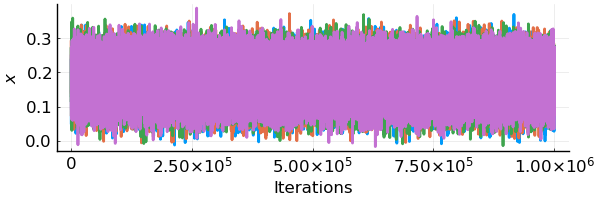

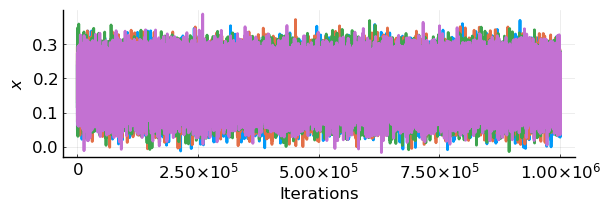

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_x.pdf"

In [33]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    x_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"x",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_x.pdf")
savefig(output_filename)

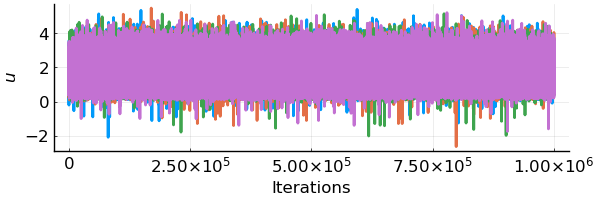

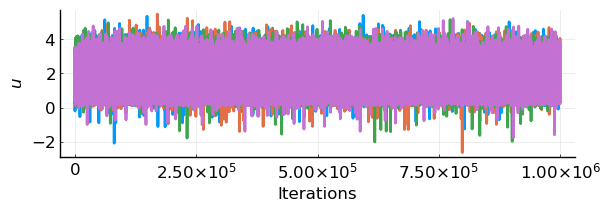

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_u.pdf"

In [34]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    u_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"u",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_u.pdf")
savefig(output_filename)

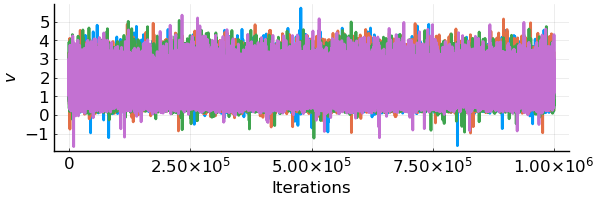

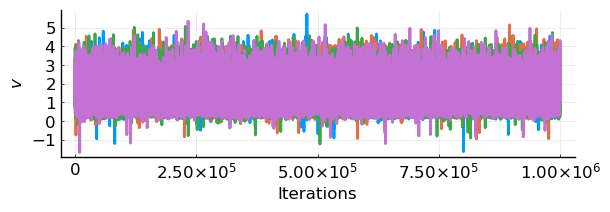

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_v.pdf"

In [35]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    v_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"v",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_v.pdf")
savefig(output_filename)

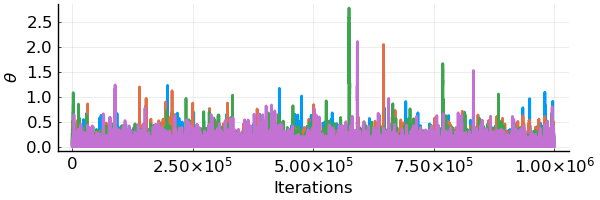

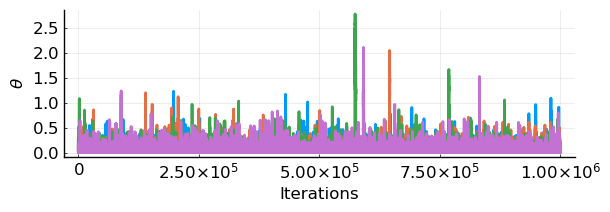

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_theta.pdf"

In [36]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    θ_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\theta",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_theta.pdf")
savefig(output_filename)

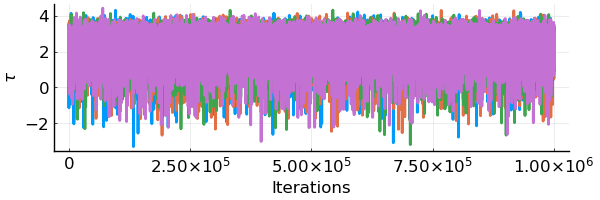

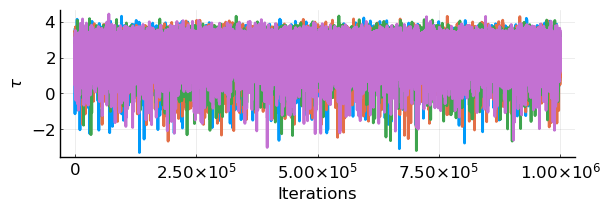

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_tau.pdf"

In [37]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    τ_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\tau",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_tau.pdf")
savefig(output_filename)

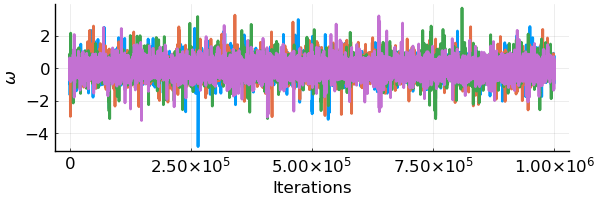

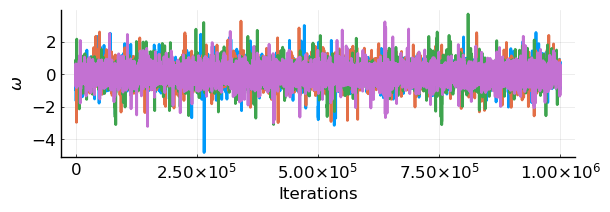

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_AM_omega.pdf"

In [38]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    ω_samples_AM, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\omega",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_AM_omega.pdf")
savefig(output_filename)

## Traces - MALA

In [62]:
# Extract the desired samples - AM 
x_samples_MALA = get(chn_MALA_original, :x).x;
θ_samples_MALA = get(chn_MALA_original, :θ).θ;

u_samples_MALA = get(chn_MALA_priorNormalized, :u).u;
τ_samples_MALA = get(chn_MALA_priorNormalized, :τ).τ;

x_samples_MALA_pullback = get(chn_MALA_pullback, :x).x;
θ_samples_MALA_pullback = get(chn_MALA_pullback, :θ).θ;

v_samples_MALA = get(chn_MALA_CalvettiSomersalo, :v).v;
ω_samples_MALA = get(chn_MALA_CalvettiSomersalo, :ω).ω;

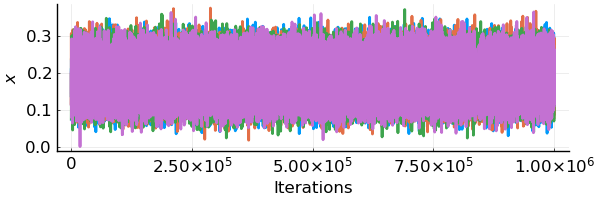

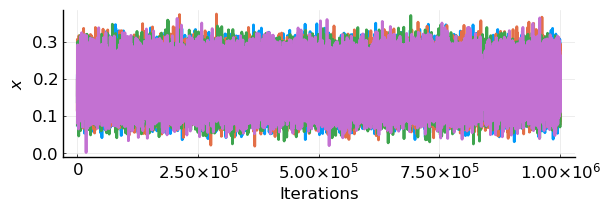

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_x.pdf"

In [40]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    x_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"x",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_x.pdf")
savefig(output_filename)

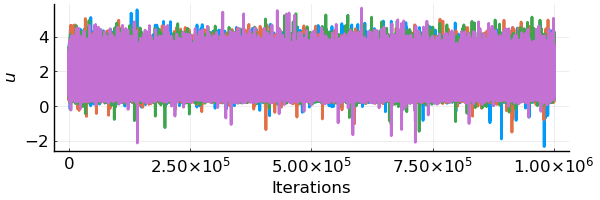

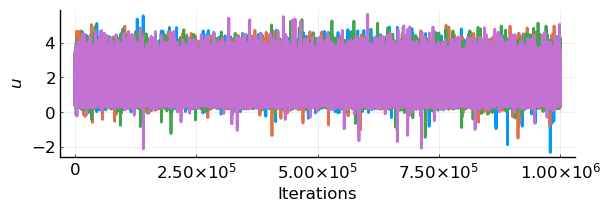

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_u.pdf"

In [41]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    u_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"u",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_u.pdf")
savefig(output_filename)

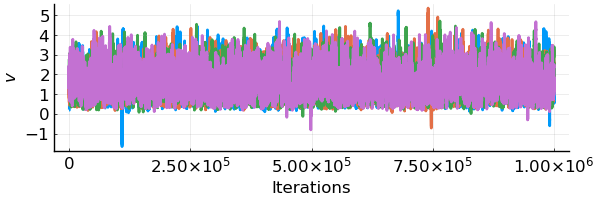

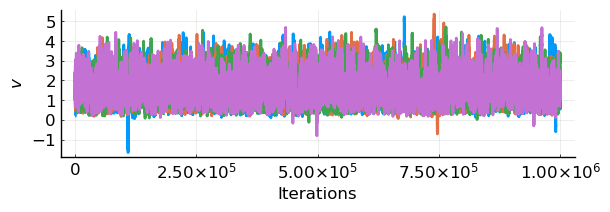

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_v.pdf"

In [42]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    v_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"v",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_v.pdf")
savefig(output_filename)

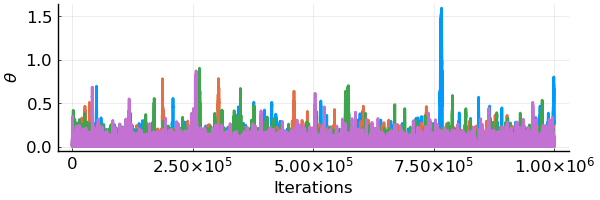

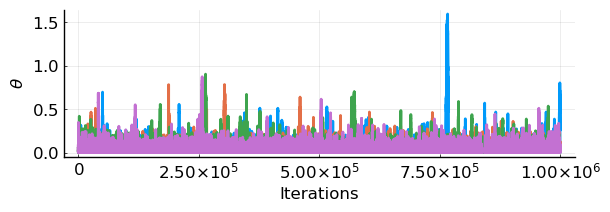

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_theta.pdf"

In [43]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    θ_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\theta",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_theta.pdf")
savefig(output_filename)

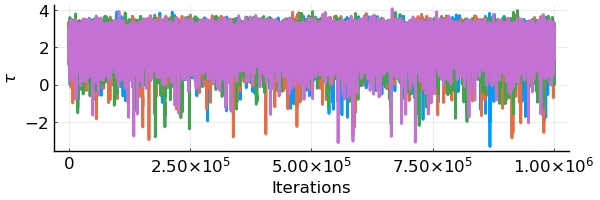

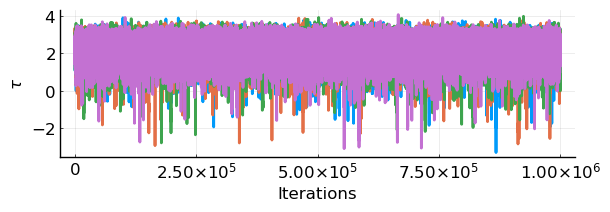

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_tau.pdf"

In [44]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    τ_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\tau",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_tau.pdf")
savefig(output_filename)

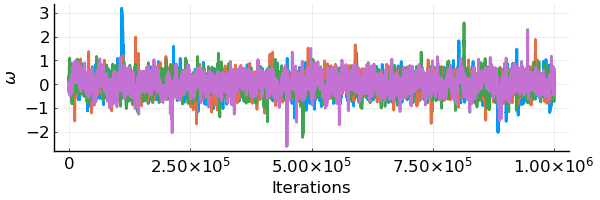

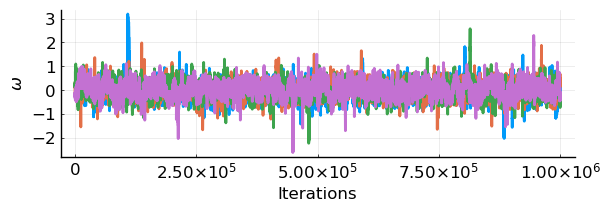

"/Users/janglaubitz/src/2024_priorNormalization_dev/PriorNormalization.jl/notebooks/figures/toy_rm1_traces_MALA_omega.pdf"

In [45]:
# Generate figure
Plots.pyplot()

# Create the traceplot
p = StatsPlots.plot(
    ω_samples_MALA, 
    lw=2, 
    legend=false, 
    xlabel="Iterations", ylabel=L"\omega",
    tickfontsize=12, labelfontsize=12,  
    size=(600,200)
)

# Display the plot
display(p)

# Save the plot 
script_directory = @__DIR__  # Gets the directory of the current script
output_filename = joinpath(script_directory, 
    "figures/toy_rm1_traces_MALA_omega.pdf")
savefig(output_filename)

## Multivariate potential scale reduction factor (MPSRF)

In [46]:
# AM for original posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_AM_original);
MPSRF_AM_original = MPSRF[2] .- 1;
MPSRFperSec_AM_original = MPSRF_AM_original * wall_duration_AM_original;

# Show results 
@show wall_duration_AM_original
@show MPSRF_AM_original
@show MPSRFperSec_AM_original;

wall_duration_AM_original = 6.161
MPSRF_AM_original = 0.00017582117947956277
MPSRFperSec_AM_original = 0.0010832342867735862


In [47]:
# AM for prior-normalized posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_AM_priorNormalized);
MPSRF_AM_priorNormalized = MPSRF[2] .- 1;
MPSRFperSec_AM_priorNormalized = MPSRF_AM_priorNormalized * wall_duration_AM_priorNormalized;

# Show results 
@show wall_duration_AM_priorNormalized
@show MPSRF_AM_priorNormalized
@show MPSRFperSec_AM_priorNormalized;

wall_duration_AM_priorNormalized = 5.616
MPSRF_AM_priorNormalized = 1.3092024806926617e-5
MPSRFperSec_AM_priorNormalized = 7.352481131569988e-5


In [48]:
# AM for CalvettiSomersalo posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_AM_CalvettiSomersalo);
MPSRF_AM_CalvettiSomersalo = MPSRF[2] .- 1;
MPSRFperSec_AM_CalvettiSomersalo = MPSRF_AM_CalvettiSomersalo * wall_duration_AM_CalvettiSomersalo;

# Show results 
@show wall_duration_AM_CalvettiSomersalo
@show MPSRF_AM_CalvettiSomersalo
@show MPSRFperSec_AM_CalvettiSomersalo;

wall_duration_AM_CalvettiSomersalo = 3.167
MPSRF_AM_CalvettiSomersalo = 0.00011194404406089653
MPSRFperSec_AM_CalvettiSomersalo = 0.00035452678754085927


In [49]:
# MALA for original posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_MALA_original);
MPSRF_MALA_original = MPSRF[2] .- 1;
MPSRFperSec_MALA_original = MPSRF_MALA_original * wall_duration_MALA_original;

# Show results 
@show wall_duration_MALA_original
@show MPSRF_MALA_original
@show MPSRFperSec_MALA_original;

wall_duration_MALA_original = 13.887
MPSRF_MALA_original = 0.001089786106049484
MPSRFperSec_MALA_original = 0.015133859654709186


In [50]:
# MALA for prior-normalized posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_MALA_priorNormalized);
MPSRF_MALA_priorNormalized = MPSRF[2] .- 1;
MPSRFperSec_MALA_priorNormalized = MPSRF_MALA_priorNormalized * wall_duration_MALA_priorNormalized;

# Show results 
@show wall_duration_MALA_priorNormalized
@show MPSRF_MALA_priorNormalized
@show MPSRFperSec_MALA_priorNormalized;

wall_duration_MALA_priorNormalized = 16.12
MPSRF_MALA_priorNormalized = 0.00040298057659127196
MPSRFperSec_MALA_priorNormalized = 0.0064960468946513045


In [51]:
# MALA for CalvettiSomersalo posterior 

# Compute results
MPSRF = gelmandiag_multivariate(chn_MALA_CalvettiSomersalo);
MPSRF_MALA_CalvettiSomersalo = MPSRF[2] .- 1;
MPSRFperSec_MALA_CalvettiSomersalo = MPSRF_MALA_CalvettiSomersalo * wall_duration_MALA_CalvettiSomersalo;

# Show results 
@show wall_duration_MALA_CalvettiSomersalo
@show MPSRF_MALA_CalvettiSomersalo
@show MPSRFperSec_MALA_CalvettiSomersalo;

wall_duration_MALA_CalvettiSomersalo = 9.267
MPSRF_MALA_CalvettiSomersalo = 0.0059564575484016835
MPSRFperSec_MALA_CalvettiSomersalo = 0.055198492101038395


### Illustrate the different MPSRF's over time

In [52]:
# Compute the MPSRF versus number of samples 
num_points = 10  # Number of equidistant points
increments = Int.( ceil.( maprange(log, 10^2, nr_samples, length=num_points) ))

# Arrays for time 
time_AM_original = range(0, wall_duration_AM_original, length=num_points)
time_AM_priorNormalized = range(0, wall_duration_AM_priorNormalized, length=num_points)
time_MALA_original = range(0, wall_duration_MALA_original, length=num_points)
time_MALA_priorNormalized = range(0, wall_duration_MALA_priorNormalized, length=num_points)

# Array to store MPSRF values
MPSRF_values_AM_original = Float64[]
MPSRF_values_AM_priorNormalized = Float64[]
MPSRF_values_MALA_original = Float64[]
MPSRF_values_MALA_priorNormalized = Float64[]

# Compute MPSRF for each subset of the chain
for n in increments
    # Compute MPSRF for AM and the original posterior 
    sub_chain = chn_AM_original[1:n, :, :]  # Subset the chain to the first n samples
    MPSRF = gelmandiag_multivariate(sub_chain)
    push!(MPSRF_values_AM_original, MPSRF[2])
    
    # Compute MPSRF for AM and the prior-normalized posterior 
    sub_chain = chn_AM_priorNormalized[1:n, :, :]  # Subset the chain to the first n samples
    MPSRF = gelmandiag_multivariate(sub_chain)
    push!(MPSRF_values_AM_priorNormalized, MPSRF[2])
    
    # Compute MPSRF for MALA and the original posterior 
    sub_chain = chn_MALA_original[1:n, :, :]  # Subset the chain to the first n samples
    MPSRF = gelmandiag_multivariate(sub_chain)
    push!(MPSRF_values_MALA_original, MPSRF[2])
    
    # Compute MPSRF for MALA and the prior-normalized posterior 
    sub_chain = chn_MALA_priorNormalized[1:n, :, :]  # Subset the chain to the first n samples
    MPSRF = gelmandiag_multivariate(sub_chain)
    push!(MPSRF_values_MALA_priorNormalized, MPSRF[2])
end

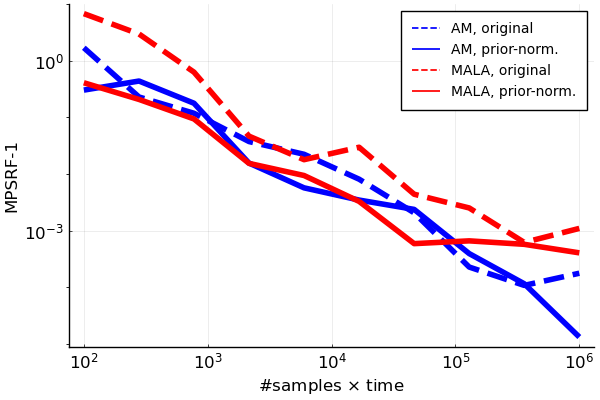

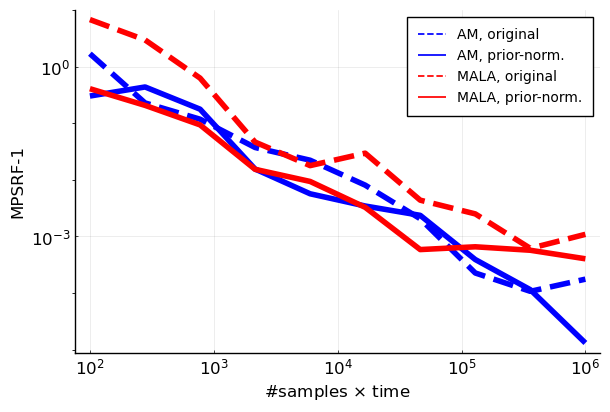

In [53]:
# Generate figure
Plots.pyplot()

# Create the plots for AM
plot_MPSRF = plot( 
    increments,#*wall_duration_AM_original, 
    MPSRF_values_AM_original.-1; 
    label="AM, original", lw=4, ls=:dash, color=:blue
)
plot!( plot_MPSRF, 
    increments,#*wall_duration_AM_priorNormalized, 
    MPSRF_values_AM_priorNormalized.-1; 
    label="AM, prior-norm.", lw=4, ls=:solid, color=:blue
)

# Create the plots for MALA
plot!( plot_MPSRF, 
    increments,#*wall_duration_MALA_original, 
    MPSRF_values_MALA_original.-1; 
    label="MALA, original", lw=4, ls=:dash, color=:red
)
plot!( plot_MPSRF, 
    increments,#*wall_duration_MALA_priorNormalized, 
    MPSRF_values_MALA_priorNormalized.-1; 
    label="MALA, prior-norm.", lw=4, ls=:solid, color=:red
)

# Make some cosmetic changes to the plot 
plot!( plot_MPSRF, 
    xscale=:log10, yscale=:log10, # log scale for x-axis and labels
    xlabel=L"#samples $\times$ time", ylabel="MPSRF-1", # labels 
    tickfontsize=12, labelfontsize=12, legendfontsize=10#, # font sizes 
    #xticks=xticks, yticks=yticks
)

# Display the plot
display(plot_MPSRF)

# Save the plot 
#script_directory = @__DIR__  # Gets the directory of the current script
#output_filename = joinpath(script_directory, 
#    "figures/MPSRF_rm1.pdf")
#savefig(output_filename)

## Effective sample size (ESS)

In [54]:
# AM for original posterior 

# Compute results
ESS_AM_original = ess(chn_AM_original)
ESS_perSec_AM_original = ESS_AM_original[:,2] / wall_duration_AM_original;

# Show results 
@show wall_duration_AM_original
@show ESS_AM_original[:,2]
@show ESS_perSec_AM_original;

wall_duration_AM_original = 6.161
ESS_AM_original[:, 2] = [70908.2216742959, 90506.00728545]
ESS_perSec_AM_original = [11509.206569436115, 14690.148885805876]


In [55]:
# AM for prior-normalized posterior 

# Compute results
ESS_AM_priorNormalized = ess(chn_AM_priorNormalized);
ESS_perSec_AM_priorNormalized = ESS_AM_priorNormalized[:,2] / wall_duration_AM_priorNormalized;

# Show results 
@show wall_duration_AM_priorNormalized
@show ESS_AM_priorNormalized[:,2]
@show ESS_perSec_AM_priorNormalized;

wall_duration_AM_priorNormalized = 5.616
ESS_AM_priorNormalized[:, 2] = [161980.22767234698, 155677.6104488814]
ESS_perSec_AM_priorNormalized = [28842.63313254042, 27720.372230926176]


In [56]:
# AM for CalvettiSomersalo posterior 

# Compute results
ESS_AM_CalvettiSomersalo = ess(chn_AM_CalvettiSomersalo);
ESS_perSec_AM_CalvettiSomersalo = ESS_AM_CalvettiSomersalo[:,2] / wall_duration_AM_CalvettiSomersalo;

# Show results 
@show wall_duration_AM_CalvettiSomersalo
@show ESS_AM_CalvettiSomersalo[:,2]
@show ESS_perSec_AM_CalvettiSomersalo;

wall_duration_AM_CalvettiSomersalo = 3.167
ESS_AM_CalvettiSomersalo[:, 2] = [201535.87096644257, 35962.73345424334]
ESS_perSec_AM_CalvettiSomersalo = [63636.208072763686, 11355.457358460164]


In [57]:
# MALA for original posterior 

# Compute results
ESS_MALA_original = ess(chn_MALA_original);
ESS_perSec_MALA_original = ESS_MALA_original[:,2] / wall_duration_MALA_original;

# Show results 
@show wall_duration_MALA_original
@show ESS_MALA_original[:,2]
@show ESS_perSec_MALA_original;

wall_duration_MALA_original = 13.887
ESS_MALA_original[:, 2] = [28795.303777979905, 29407.287501491537]
ESS_perSec_MALA_original = [2073.5438739814144, 2117.6126954339697]


In [58]:
# MALA for prior-normalized posterior 

# Compute results
ESS_MALA_priorNormalized = ess(chn_MALA_priorNormalized);
ESS_perSec_MALA_priorNormalized = ESS_MALA_priorNormalized[:,2] / wall_duration_MALA_priorNormalized;

# Show results 
@show wall_duration_MALA_priorNormalized
@show ESS_MALA_priorNormalized[:,2]
@show ESS_perSec_MALA_priorNormalized;

wall_duration_MALA_priorNormalized = 16.12
ESS_MALA_priorNormalized[:, 2] = [67352.56166154373, 65370.652258084025]
ESS_perSec_MALA_priorNormalized = [4178.198614239685, 4055.251380774443]


In [59]:
# MALA for CalvettiSomersalo posterior 

# Compute results
ESS_MALA_CalvettiSomersalo = ess(chn_MALA_CalvettiSomersalo);
ESS_perSec_MALA_CalvettiSomersalo = ESS_MALA_CalvettiSomersalo[:,2] / wall_duration_MALA_CalvettiSomersalo;

# Show results 
@show wall_duration_MALA_CalvettiSomersalo
@show ESS_MALA_CalvettiSomersalo[:,2]
@show ESS_perSec_MALA_CalvettiSomersalo;

wall_duration_MALA_CalvettiSomersalo = 9.267
ESS_MALA_CalvettiSomersalo[:, 2] = [9969.230750883473, 9906.18103682577]
ESS_perSec_MALA_CalvettiSomersalo = [1075.7775710460207, 1068.973889805306]
